# Example Usage

In [1]:
%matplotlib inline
import chalc as ch
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"
import h5py, warnings

For our data we sample 100 points on a circle with some noise and 100 points from inside the unit disk.

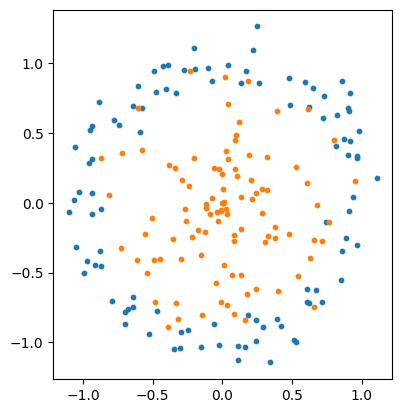

In [2]:
np.random.seed(40)
num_points = 100
mean = [0, 0]
cov = np.eye(2)*0.01
x = np.array([[np.sin(2*np.pi*t), np.cos(2*np.pi*t)] for t in np.random.rand(num_points)]).T +\
    np.random.default_rng().multivariate_normal(mean, cov, num_points).T # points as columns
y = np.random.rand(num_points) * np.array([[np.sin(2*np.pi*t), np.cos(2*np.pi*t)] for t in np.random.rand(num_points)]).T
points = np.concatenate((x,y), axis=1)
plt.scatter(x[0, :], x[1, :], s=10)
plt.scatter(y[0, :], y[1, :], s=10)
plt.gca().set_aspect('equal')
colours = [0]*100 + [1]*100


We compute the chromatic alpha complex $K$ of the point cloud. $K$ has far fewer simplices than either the Cech or Vietoris-Rips complex, which each have $\displaystyle \binom{200}{2} = 19900$ edges and $\displaystyle \binom{200}{3} = 1313400$ 2-simplices. 

In [3]:
K = ch.chromatic.alpha(points, colours)
print(f'{len(K.simplices[1])} 1-simplices')
print(f'{len(K.simplices[2])} 2-simplices')

940 1-simplices
1284 2-simplices


We can compute the six-pack of persistent homology diagrams of the chromatic alpha complex, the chromatic Delaunay-Cech complex, and the chromatic Delaunay-Rips complex.

Decomposed g
Decomposed f
Decomposed im
Decomposed cok
Decomposed rel
Decomposed ker


Decomposed g
Decomposed im
Decomposed f
Decomposed cok
Decomposed ker
Decomposed rel


Decomposed g
Decomposed rel
Decomposed f
Decomposed cok
Decomposed im
Decomposed ker


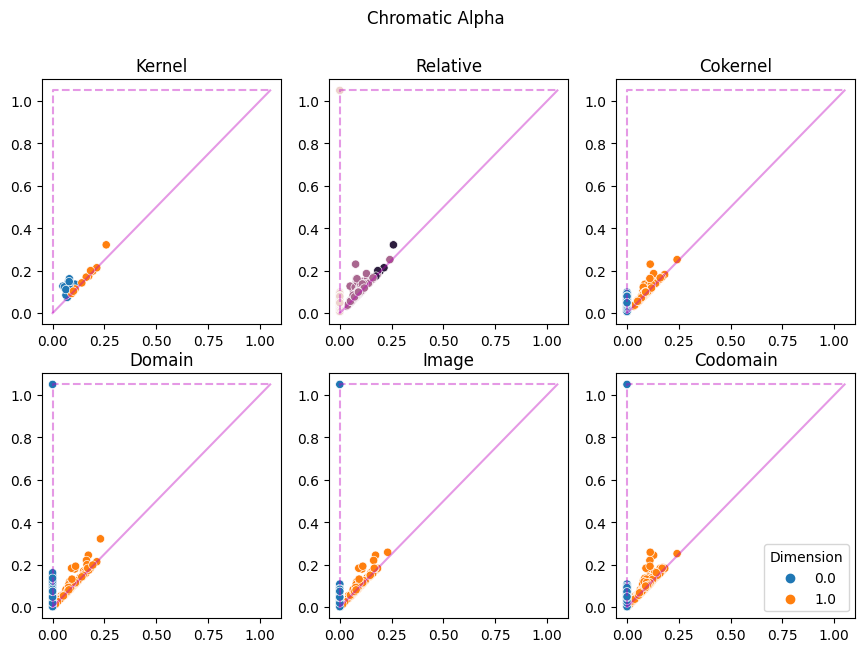

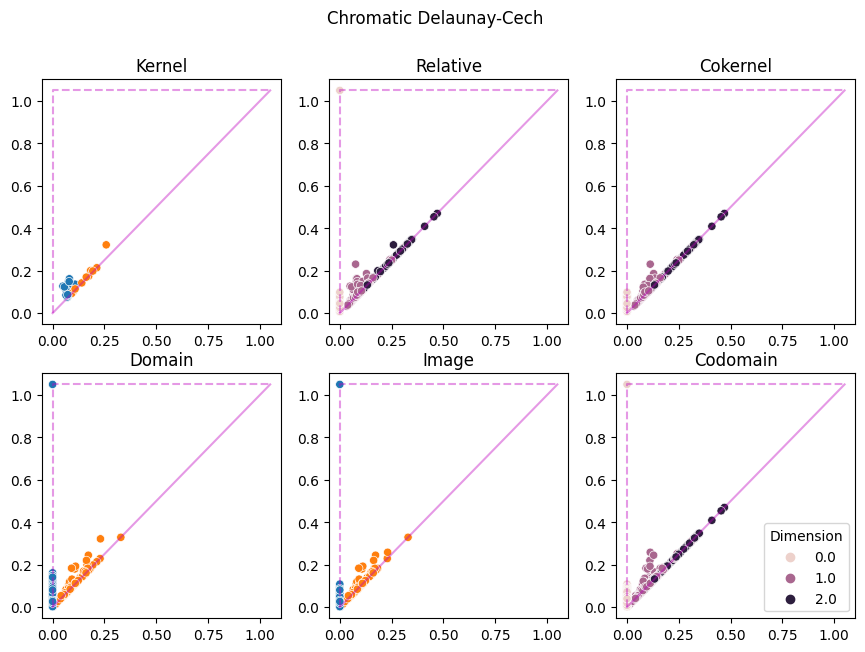

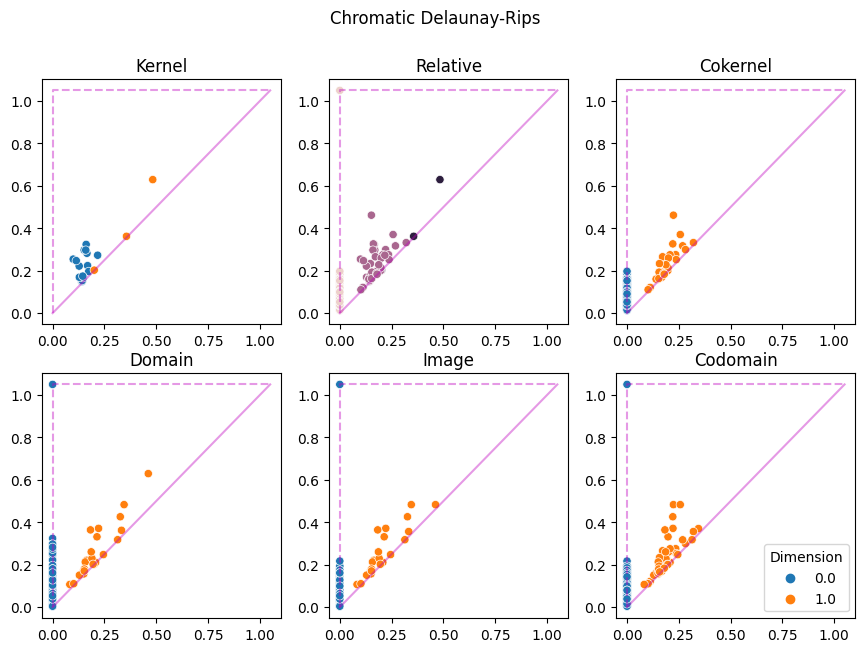

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    truncation = 1.0
    dgms_alpha = ch.sixpack.compute(points, colours, dom=[0,], method="chromatic alpha")
    fig_alpha, ax_alpha = ch.plotting.plot_sixpack(dgms_alpha, truncation, max_diagram_dim=2)
    fig_alpha.suptitle('Chromatic Alpha')
    dgms_delcech = ch.sixpack.compute(points, colours, dom=[0,], method="chromatic delcech")
    fig_delcech, ax_delcech = ch.plotting.plot_sixpack(dgms_delcech, truncation, max_diagram_dim=2)
    fig_delcech.suptitle('Chromatic Delaunay-Cech')
    dgms_delrips = ch.sixpack.compute(points, colours, dom=[0,], method="chromatic delrips")
    fig_delrips, ax_delrips = ch.plotting.plot_sixpack(dgms_delrips, truncation, max_diagram_dim=2)
    fig_delrips.suptitle('Chromatic Delaunay-Rips')

Each six-pack is an object having attributes ``ker``, ``cok``, ``im``, ``dom``, ``cod``, ``rel``, ``entrance_times``, and ``dimensions``. Each of the first six of those attributes is an object that has sets of paired and unpaired simplices, while the last two attributes indicate the filtration time of those simplices. For example-

In [5]:
dgms_alpha.ker.paired

{(335, 718),
 (373, 706),
 (401, 661),
 (404, 532),
 (428, 454),
 (435, 456),
 (436, 474),
 (442, 554),
 (447, 524),
 (468, 768),
 (496, 767),
 (506, 797),
 (518, 750),
 (527, 666),
 (553, 603),
 (651, 737),
 (1300, 1301),
 (1319, 1326),
 (1362, 1379),
 (1374, 1375),
 (1407, 1434),
 (1432, 1433),
 (1452, 1453),
 (1511, 1512),
 (1533, 1534),
 (1552, 1562),
 (1608, 1609),
 (1616, 1617),
 (1627, 1661),
 (1654, 1655),
 (1680, 1685),
 (1711, 1712),
 (1725, 1776),
 (1745, 1746),
 (1750, 1751),
 (1753, 1766),
 (1778, 1779),
 (1816, 1821),
 (1906, 1907),
 (1909, 2007),
 (1918, 1919),
 (1924, 1925),
 (1942, 1943),
 (1944, 1945),
 (1986, 1987),
 (2002, 2003),
 (2061, 2062),
 (2065, 2066),
 (2124, 2125),
 (2126, 2127),
 (2288, 2289),
 (2394, 2395),
 (2396, 2397),
 (2416, 2417),
 (2418, 2419)}

We can save the diagrams to file or load a diagram from file:

In [6]:
with h5py.File('test.h5', 'w') as f:
    ch.sixpack.save_diagrams(dgms_alpha, f)

with h5py.File('test.h5', 'r') as f:
    dgms = ch.sixpack.load_diagrams(f)

We can visualise the 2-skeleton of the filtration for points in 2D:

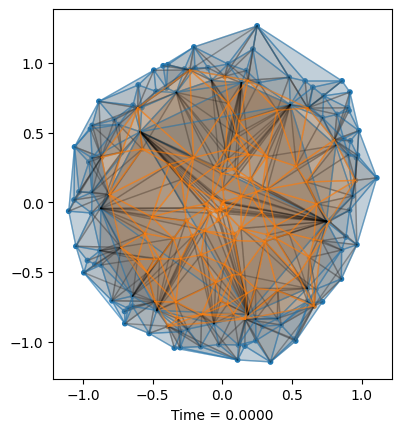

In [7]:
ani = ch.plotting.animate_filtration(
    K, points, filtration_times=np.linspace(0, 1.0, 45), animation_length=5)
ani